<div style="text-align: center;">
    <img src="https://www.velvetech.com/wp-content/uploads/2023/10/retail-data-analytics-fb-1024x538.png" alt="Retail Data Logo" style="width: 100%; display: block;" />
</div>

<font size="+4" color="#00008B"><h1>Online Retail Data Analysis </h1></font>

<font size="+2" color="#00008B">Capstone Project</font>

#### By: Onkar Bhise

<font color="#A020F0"><h1>Problem Statement:</h1></font>

An online retail store is trying to understand the various customer purchase patterns for their firm, you are required to give enough evidence based insights to provide the same.

<font color="#A020F0"><h2>Dataset Information:</h2></font>

The dataset contains 8 columns.
<b> Data Description </b>
<b>Attribute Information: </b>

- **InvoiceNo:** Invoice number. Nominal, a 6-digit integral number uniquely assigned to each transaction. If this code starts with letter 'c', it indicates a cancellation.
- **StockCode:** Product (item) code. Nominal, a 5-digit integral number uniquely assigned to each distinct product.
- **Description:** Product (item) name. Nominal.
- **Quantity:** The quantities of each product (item) per transaction. Numeric.
- **InvoiceDate:** Invice Date and time. Numeric, the day and time when each transaction was generated.
- **UnitPrice:** Unit price. Numeric, Product price per unit in sterling.
- **CustomerID:** Customer number. Nominal, a 5-digit integral number uniquely assigned to each customer.
- **Country:** Country name. Nominal, the name of the country where each customer resides.

<div style="text-align: left">

| Feature Name   | Description                                      |
|----------------|--------------------------------------------------|
| <font color="#004080">Invoice</font>          | Invoice number                                 |
| <font color="#004080">StockCode</font>           | Product ID                                   |
| <font color="#004080">Description</font>   | Product Description            |
| <font color="#004080">Quantity</font>   | Quantity of the product                 |
| <font color="#004080">InvoiceDate</font>    | Date of the invoice                |
| <font color="#004080">Price</font>     | Price of the product per unit                        |
| <font color="#004080">CustomerID</font>           | Customer ID                             |
| <font color="#004080">Country</font>   | Region of Purchase                                 |

</div>
<font color="#A020F0"><h2>Steps Followed:</h2></font>
<font color="#000000">1. Data Importing </br>
    2. Data Preprocessing </br>
    3. Feature Engineering </br>
    4. Exploatry Data Analysis </br>
    5. Predective Modeling </br>
</font>


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option("display.max_columns", 30)
import warnings
warnings.filterwarnings('ignore')
from numpy import math
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import plotly.express as px
import matplotlib.cm as cm
from sklearn.preprocessing import StandardScaler
import plotly.graph_objs as go
import plotly.io as pio
pio.renderers.default = "notebook+pdf" 

In [2]:
df = pd.read_csv("OnlineRetail (3).csv",encoding="ISO-8859-1")

In [3]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


<font color="#A020F0"><h2>Data Preprocessing:</h2></font>
- Data preprocessing is a vital stage in data analysis where raw data is transformed, cleaned, and organized to enhance its quality for further analysis.
- This step ensures that the data is accurate, complete, and appropriately formatted, setting the foundation for more effective and reliable analysis and modeling.
1. Checking null values in df
2. Checking if there are any duplicate records, if yes, handling them.
3. Checking numerical columns.
4. Checking cancelled orders and moving them into new dataframe.

In [5]:
missing_info = df.isnull().sum()
missing_info = pd.DataFrame({'Missing Count': missing_info, 'Missing Percentage': (missing_info / len(df)) * 100})
print(missing_info)

             Missing Count  Missing Percentage
InvoiceNo                0            0.000000
StockCode                0            0.000000
Description           1454            0.268311
Quantity                 0            0.000000
InvoiceDate              0            0.000000
UnitPrice                0            0.000000
CustomerID          135080           24.926694
Country                  0            0.000000


- CustomerID is our identification feature, so if its missing means then other related values won't help in analysis.
- Dropping those rows with missing values.

In [6]:
df.dropna(inplace = True)
print(df.shape)

(406829, 8)


In [7]:
duplicated_records_count = df.duplicated().sum()
print("Number of duplicated records:", duplicated_records_count)
duplicated_records = df[df.duplicated()]

Number of duplicated records: 5225


In [8]:
print("Shape before removing duplicates:", df.shape)
df = df.drop_duplicates()
print("Shape after removing duplicates:", df.shape)

Shape before removing duplicates: (406829, 8)
Shape after removing duplicates: (401604, 8)


In [9]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,401604.000000,401604.000000,401604.000000
mean,12.183273,3.474064,15281.160818
std,250.283037,69.764035,1714.006089
min,-80995.000000,0.000000,12346.000000
25%,2.000000,1.250000,13939.000000
50%,5.000000,1.950000,15145.000000
75%,12.000000,3.750000,16784.000000
max,80995.000000,38970.000000,18287.000000


- Here Quantity column has minimum value in negative
- Unit Price has 0 as minimum value

In [10]:
df[df['Quantity']<0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,12/1/2010 9:41,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,12/1/2010 9:49,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,12/1/2010 10:24,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom
...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,12/9/2011 9:57,0.83,14397.0,United Kingdom
541541,C581499,M,Manual,-1,12/9/2011 10:28,224.69,15498.0,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,12/9/2011 11:57,10.95,15311.0,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,12/9/2011 11:58,1.25,17315.0,United Kingdom


- From above, we  can tell that if invoice number starts with 'C' then it is cancelled or returned order.

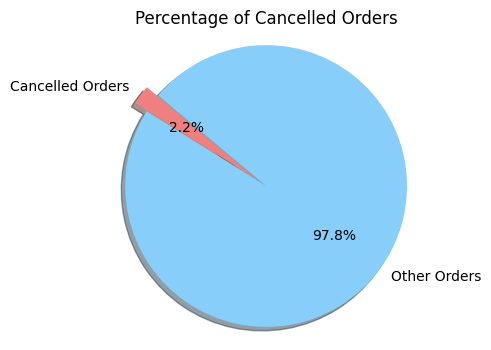

In [11]:
cancelled_orders = df[df['Quantity']<0]

# Calculating the percentage of cancelled orders
total_orders = len(df)
cancelled_percentage = (len(cancelled_orders) / total_orders) * 100
#plotting pie chart
labels = ['Cancelled Orders', 'Other Orders']
sizes = [cancelled_percentage, 100 - cancelled_percentage]
colors = ['lightcoral', 'lightskyblue']
plt.figure(figsize = (4,4))
explode = (0.1, 0)  
# explode the Cancelled Orders slice
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal') 
plt.title('Percentage of Cancelled Orders')
plt.show()

In [12]:
cancelled_orders.shape

(8872, 8)

In [13]:
# Droping cancelled orders from original dataframe
df = df[~df['Quantity'] < 0 ]

In [14]:
#checking how many values are present for unit price = 0
len(df[df['UnitPrice'] == 0])

40

In [15]:
# Removing records with '0' unit price
df =df[df['UnitPrice']>0]

In [16]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,392692.000000,392692.000000,392692.000000
mean,13.119702,3.125914,15287.843865
std,180.492832,22.241836,1713.539549
min,1.000000,0.001000,12346.000000
25%,2.000000,1.250000,13955.000000
50%,6.000000,1.950000,15150.000000
75%,12.000000,3.750000,16791.000000
max,80995.000000,8142.750000,18287.000000


In [17]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


<font color="#A020F0"><h2>Feature Engineering:</h2></font>
- Feature engineering is the process of creating new features or transforming existing features in a dataset to improve the performance of machine learning models.
- This involves selecting, modifying, or creating new variables (features) from the raw data that can help the model better understand the underlying patterns and relationships in the data.
1. Finding total amount for each order.
2. Converting InvoiceDate column type to DateTime format.
3. Extracting Day, Month, Hour, month name and day name from InvoiceDate.
4. Creating time slots.

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 392692 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    392692 non-null  object 
 1   StockCode    392692 non-null  object 
 2   Description  392692 non-null  object 
 3   Quantity     392692 non-null  int64  
 4   InvoiceDate  392692 non-null  object 
 5   UnitPrice    392692 non-null  float64
 6   CustomerID   392692 non-null  float64
 7   Country      392692 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 27.0+ MB


In [19]:
# Finding total amount for each order
df['TotalAmount'] = df['Quantity'] * df['UnitPrice']

In [20]:
#Converting InvoiceDate to datetime format, to extract Day, Month, Year, Hour.
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], format="%m/%d/%Y %H:%M")

In [21]:
df['Year'] = df['InvoiceDate'].dt.year
df['Month_num'] = df['InvoiceDate'].dt.month
df['Date'] = df['InvoiceDate'].dt.day
df['Hour'] = df['InvoiceDate'].dt.hour
#Extracting month name and day name
df['Month'] = df['InvoiceDate'].dt.month_name()
df['Day'] = df['InvoiceDate'].dt.day_name()

In [22]:
def categorise(Hour):
    if 6 <= Hour < 9:
        return '6:00 to 9:00'
    if 9 <= Hour < 12:
        return '9:00 to 12:00'
    if 12 <= Hour < 15:
        return '12:00 to 15:00'
    if 15 <= Hour < 18:
        return '15:00 to 18:00'
    if 18 <= Hour < 21:
        return '18:00 to 21:00'

df['TimeSlot'] = df['Hour'].apply(categorise)

In [23]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalAmount,Year,Month_num,Date,Hour,Month,Day,TimeSlot
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010,12,1,8,December,Wednesday,6:00 to 9:00
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010,12,1,8,December,Wednesday,6:00 to 9:00
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010,12,1,8,December,Wednesday,6:00 to 9:00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010,12,1,8,December,Wednesday,6:00 to 9:00
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010,12,1,8,December,Wednesday,6:00 to 9:00


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 392692 entries, 0 to 541908
Data columns (total 16 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    392692 non-null  object        
 1   StockCode    392692 non-null  object        
 2   Description  392692 non-null  object        
 3   Quantity     392692 non-null  int64         
 4   InvoiceDate  392692 non-null  datetime64[ns]
 5   UnitPrice    392692 non-null  float64       
 6   CustomerID   392692 non-null  float64       
 7   Country      392692 non-null  object        
 8   TotalAmount  392692 non-null  float64       
 9   Year         392692 non-null  int64         
 10  Month_num    392692 non-null  int64         
 11  Date         392692 non-null  int64         
 12  Hour         392692 non-null  int64         
 13  Month        392692 non-null  object        
 14  Day          392692 non-null  object        
 15  TimeSlot     392692 non-null  obje

<font color="#A020F0"><h2>Exploratory Data Analysis:</h2></font>
- Its primary goal is to understand the data's structure, patterns, and relationships between variables.
- Using variety of techniques to uncover insights, detect anomalies, and test assumptions.

1. Creating functions for bar plot, distribution plot, pie chart.
2. Finding Country wise customer count and top 10 countries with most customers.
3. Finding least and most sold products.
4. Checking Sales and Orders timeline to check if there are any trends
5. Checking monthly sales and orders 
6. Finding bestselling product in each month
7. Checking Weekday wise order placed and total sales
8. Checking in which hour of the day most orders are placed
9. Checking on which date of month most orders are placed

In [25]:
def create_bar_plot(df, xaxis, yaxis, title, num, color_col):
    fig = px.bar(df, x=xaxis, y=yaxis, color=color_col,
                 labels={xaxis: xaxis, yaxis: yaxis}, color_continuous_scale='sunset')
    fig.update_layout(title=title, xaxis={'tickangle': num}, yaxis={'title': yaxis})
    fig.show()
    plt.gcf().set_size_inches(10, 6)  # Set a larger figure size (10x6 inches, for example)
    plt.gcf().set_dpi(120)  # Set a higher DPI value (120, for example)
    plt.savefig('output.pdf', bbox_inches='tight')  # Use bbox_inches='tight' to fit the entire plot
    plt.show()


def create_distplot(p,title):
    plt.figure(figsize=(12,6))
    sns.distplot(x=p)
    plt.title(title)

def create_pie_chart(data, values_column, names_column, chart_title):
    grouped_data = data.groupby(names_column)[values_column].sum().reset_index()
    labels = grouped_data[names_column]
    values = grouped_data[values_column]
    text = [f'{label}<br>{(val / sum(values)) * 100:.2f}%' for label, val in zip(labels, values)]
    fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='text', text=text, insidetextorientation='radial')])
    fig.update_layout(title=chart_title)
    fig.show()
    
def create_line_plot(x_data, y_data, x_title, y_title, title):
    fig = px.line(x=x_data, y=y_data, markers=True)
    fig.update_layout(
        title=title,
        xaxis_title=x_title,
        yaxis_title=y_title
    )
    fig.show()

### 1. Finding countries with most customers

In [26]:
customer_count_per_country = df.groupby('Country')['CustomerID'].nunique().sort_values(ascending=False)
customer_count_per_country = customer_count_per_country.reset_index().rename(columns = {'Country':'Country','CustomerID':'No. of Customers'})
total_customers = customer_count_per_country['No. of Customers'].sum()
customer_count_per_country['Percentage'] = (customer_count_per_country['No. of Customers'] / total_customers) * 100
print(customer_count_per_country.head(10))

          Country  No. of Customers  Percentage
0  United Kingdom              3920   90.197883
1         Germany                94    2.162908
2          France                87    2.001841
3           Spain                30    0.690290
4         Belgium                25    0.575242
5     Switzerland                21    0.483203
6        Portugal                19    0.437184
7           Italy                14    0.322135
8         Finland                12    0.276116
9         Austria                11    0.253106


In [27]:
create_bar_plot(customer_count_per_country.head(10), 'Country', 'Percentage', 'Top 10 Countries by Customer Count', 0, 'No. of Customers')

<Figure size 1200x720 with 0 Axes>

### 2. Finding total orders and total sales in each countries

In [28]:
orders_per_country = df.groupby('Country')['InvoiceNo'].nunique().sort_values(ascending = False).reset_index().rename(columns = {'InvoiceNo':'Total Orders'})
sales_per_country = df.groupby('Country')['TotalAmount'].sum().sort_values(ascending=False).reset_index().rename(columns={'Country':'Country', 'TotalAmount':'Total Sales'})

In [29]:
total_orders = orders_per_country['Total Orders'].sum()
total_sales = sales_per_country['Total Sales'].sum()
# Adding percentage columns to orders_per_country and sales_per_country
orders_per_country['Percentage'] = (orders_per_country['Total Orders'] / total_orders) * 100
sales_per_country['Percentage'] = (sales_per_country['Total Sales'] / total_sales) * 100

In [30]:
create_bar_plot(sales_per_country.head(10),'Country','Percentage','Top 10 Countries by Sales Amount', 0, 'Total Sales')

<Figure size 1200x720 with 0 Axes>

In [31]:
create_bar_plot(orders_per_country.head(10), 'Country','Percentage', 'Top 10 Countries by Order Count',0,'Total Orders')

<Figure size 1200x720 with 0 Axes>

### 3. Finding Most and least sold products

In [32]:
top_10_product = df['Description'].value_counts().reset_index().rename(columns={'index':'Product_name','Description':'Count'}).head(10)
top_10_product = top_10_product.sort_values(by='Count', ascending = True)

In [33]:
create_bar_plot(top_10_product.head(10),'Count','Product_name','Most sold products (top 10)',0, 'Count')

<Figure size 1200x720 with 0 Axes>

In [34]:
bottom_10_product = df['Description'].value_counts().reset_index().rename(columns={'index':'Product_name','Description':'Count'})

In [35]:
bottom_10_product.tail(10)

,Product_name,Count
3867,CRACKED GLAZE EARRINGS BROWN,1
3868,LILAC FEATHERS CURTAIN,1
3869,JET BLACK LAS VEGAS BRACELET ROUND,1
3870,KNITTED RABBIT DOLL,1
3871,SET/6 IVORY BIRD T-LIGHT CANDLES,1
3872,GREEN WITH METAL BAG CHARM,1
3873,WHITE WITH METAL BAG CHARM,1
3874,BLUE/NAT SHELL NECKLACE W PENDANT,1
3875,PINK EASTER HENS+FLOWER,1
3876,"PAPER CRAFT , LITTLE BIRDIE",1


### 4. Checking Sales and Orders Timeline

In [36]:
sales_timeline = df.groupby(df['InvoiceDate'].dt.date)['TotalAmount'].sum()
sales_timeline = pd.Series(data=sales_timeline.values, index=sales_timeline.index)

fig = px.line(x=sales_timeline.index, y=sales_timeline.values, markers=True)
fig.update_layout(
    title='Sales Timeline',
    xaxis_title='Date',
    yaxis_title='Total Sales'
)
fig.show()

In [37]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
sales_by_date = df.groupby(df['InvoiceDate'].dt.date)['TotalAmount'].sum()

date_highest_sales = sales_by_date.idxmax()
highest_sales_amount = sales_by_date.max()

print("Date with the most sales:", date_highest_sales)
print("Total sales on that date:", highest_sales_amount)

Date with the most sales: 2011-12-09
Total sales on that date: 184329.66


In [38]:
orders_timeline = df.groupby(df['InvoiceDate'].dt.date)['InvoiceNo'].nunique()
orders_timeline = pd.Series(data=orders_timeline.values, index=orders_timeline.index)
create_line_plot(x_data=orders_timeline.index, y_data=orders_timeline.values, x_title='Date', y_title='Number of Orders',
    title='Orders Timeline')

### 5. Checking monthwise orders and sales

In [39]:
month_wise_sales = df.groupby('Month')['TotalAmount'].sum().reset_index().rename(columns = {'Month':'Month','TotalAmount':'Total Sales'})
month_wise_orders = df.groupby('Month')['InvoiceNo'].nunique().reset_index().rename(columns = {'Month':'Month','InvoiceNo':'Total Orders'})
month_wise_sales = month_wise_sales.sort_values(by= 'Total Sales', ascending = False)
month_wise_orders = month_wise_orders.sort_values(by= 'Total Orders', ascending = False)

In [40]:
create_bar_plot(month_wise_sales, 'Month', 'Total Sales','Total Sales in each month', 0, 'Total Sales')

<Figure size 1200x720 with 0 Axes>

In [41]:
create_pie_chart(month_wise_orders,'Total Orders','Month','Total Orders in each month')

### 6.Best selling product in each month

In [42]:
best_selling_products = df.groupby(['Month', 'StockCode','Description'])['Quantity'].sum().reset_index()
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
best_selling_products['Month'] = pd.Categorical(best_selling_products['Month'], categories=month_order, ordered=True)
best_selling_products_sorted = best_selling_products.sort_values(by='Month')
best_selling_each_month = best_selling_products_sorted.loc[best_selling_products_sorted.groupby('Month')['Quantity'].idxmax()]

print(best_selling_each_month)

           Month StockCode                        Description  Quantity
11397    January     23166     MEDIUM CERAMIC TOP STORAGE JAR     74215
8483    February     22053              EMPIRE DESIGN ROSETTE      3986
18890      March    85099B            JUMBO BAG RED RETROSPOT      4924
1821       April     84077  WORLD WAR 2 GLIDERS ASSTD DESIGNS     10224
19856        May     22197               SMALL POPCORN HOLDER      6730
16639       June    85099B            JUMBO BAG RED RETROSPOT      3529
14056       July     84077  WORLD WAR 2 GLIDERS ASSTD DESIGNS      3600
4393      August     84879      ASSORTED COLOUR BIRD ORNAMENT      6417
29122  September    85099B            JUMBO BAG RED RETROSPOT      4175
26347    October     84077  WORLD WAR 2 GLIDERS ASSTD DESIGNS      8078
22868   November     23084                 RABBIT NIGHT LIGHT     12352
6903    December     23843        PAPER CRAFT , LITTLE BIRDIE     80995


### 7. Checking Weekday wise order placed and total sales

In [43]:
order_on_day = df['Day'].value_counts().reset_index().rename(columns = {'index':'Day','Day':'Order_count'})

In [44]:
sales_on_day = df.groupby('Day')['TotalAmount'].sum().reset_index()
sales_on_day

,Day,TotalAmount
0,Friday,1483080.811
1,Monday,1363604.401
2,Sunday,785490.321
3,Thursday,1973015.730
4,Tuesday,1697733.801
5,Wednesday,1584283.830


In [45]:
create_bar_plot(sales_on_day,'Day','TotalAmount','Sales on each Day',0,'Day')

<Figure size 1200x720 with 0 Axes>

In [46]:
create_pie_chart(order_on_day,'Order_count','Day','Orders count on Day')

### 8. Checking orders placed per hour

In [47]:
purchase_count_per_hour = df.groupby('Hour')['CustomerID'].count().reset_index().rename(columns = {'index':'Hour', 'CustomerID':'Orders Count'})
create_bar_plot(purchase_count_per_hour, 'Hour', 'Orders Count', 'Orders count per hour', 0, 'Orders Count')

<Figure size 1200x720 with 0 Axes>

In [48]:
fig2 = px.histogram(df, x='TimeSlot', title='Distribution of Time Slots', color='TimeSlot')
fig2.update_xaxes(title='Time Slots')
fig2.update_yaxes(title='Orders Count')
fig2.show()

### 9. Checking on which day of month most orders are placed

In [49]:
orders_per_date = df.groupby('Date')['InvoiceNo'].nunique().reset_index()
create_line_plot(orders_per_date['Date'], orders_per_date['InvoiceNo'], 'Date','Orders Count', 'Orders timeline')

## Checking the cancelled products

In [50]:
cancelled_orders.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,12/1/2010 9:41,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,12/1/2010 9:49,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,12/1/2010 10:24,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom


In [51]:
cancelled_orders['InvoiceDate'] = pd.to_datetime(cancelled_orders['InvoiceDate'], format="%m/%d/%Y %H:%M")

In [52]:
cancelled_orders['Quantity'] = cancelled_orders['Quantity'].abs()
cancelled_orders['TotalAmount'] = cancelled_orders['UnitPrice'] * cancelled_orders['Quantity']

In [53]:
cancelled_orders.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalAmount
141,C536379,D,Discount,1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom,27.50
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,1,2010-12-01 09:49:00,4.65,15311.0,United Kingdom,4.65
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom,19.80
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom,6.96
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom,6.96


In [54]:
orders_per_country_c = cancelled_orders.groupby('Country')['InvoiceNo'].nunique().sort_values(ascending = False).reset_index().rename(columns = {'InvoiceNo':'Total Orders'})

In [55]:
orders_per_country_c.head(10)

,Country,Total Orders
0,United Kingdom,3208
1,Germany,146
2,France,69
3,EIRE,59
4,Belgium,21
5,Switzerland,20
6,Italy,17
7,Spain,15
8,Portugal,13
9,Australia,12


In [56]:
create_bar_plot(orders_per_country_c.head(10), 'Country', 'Total Orders', 'Total Cancelled Orders (Country Wise)', 0, 'Country')

<Figure size 1200x720 with 0 Axes>

In [57]:
top_10_c_product = cancelled_orders['Description'].value_counts().reset_index().rename(columns={'index':'Product_name','Description':'Count'})
top_10_c_product = top_10_c_product.sort_values(by = 'Count', ascending=False).head(10)

In [58]:
create_bar_plot(top_10_c_product, 'Count', 'Product_name','Top 10 Cancelled Products',0,'Product_name')

<Figure size 1200x720 with 0 Axes>

# ***CUSTOMER SEGMENTATION***
---

## **Why RFM Analysis?:**

#### RFM analysis stands out due to its simplicity. Built upon Recency, Frequency, and Monetary value, it provides a clear and easily understandable framework. This simplicity facilitates quick comprehension for marketers and analysts without necessitating intricate computations.

### - **Tangible Customer Behavior Focus**:
#### The essence of RFM lies in quantifiable customer behaviors—Recency, Frequency, and Monetary value. These metrics are pivotal to customer-business interactions and are effortlessly extractable from transactional data.

- **Recency:** How recently did the customer visit our website or how recently did a customer purchase?
- **Frequency:** How often do they visit or how often do they purchase?
- **Monetary:** How much revenue we get from their visit or how much do they spend when they purchase?

In [59]:
rfm_df = df.copy()

In [60]:
Latest_date = df['InvoiceDate'].max()  # Choose a snapshot date

rfm_df = rfm_df.groupby('CustomerID').agg({'InvoiceDate': lambda x: (Latest_date - x.max()).days, 'InvoiceNo': lambda x: len(x), 'TotalAmount': lambda x: x.sum()})

#Converting Invoice Date into type int
rfm_df['InvoiceDate'] = rfm_df['InvoiceDate'].astype(int)

#Renaming column names to Recency, Frequency and Monetary
rfm_df.rename(columns={'InvoiceDate': 'Recency',
                         'InvoiceNo': 'Frequency',
                         'TotalAmount': 'Monetary'}, inplace=True)

rfm_df.reset_index().head()

,CustomerID,Recency,Frequency,Monetary
0,12346.0,325,1,77183.60
1,12347.0,1,182,4310.00
2,12348.0,74,31,1797.24
3,12349.0,18,73,1757.55
4,12350.0,309,17,334.40


In [61]:
quantile = rfm_df.quantile(q = [0.25,0.50,0.75])
quantile = quantile.to_dict()
quantile

{'Recency': {0.25: 17.0, 0.5: 50.0, 0.75: 141.0},
 'Frequency': {0.25: 17.0, 0.5: 41.0, 0.75: 98.0},
 'Monetary': {0.25: 306.48249999999996,
  0.5: 668.5700000000002,
  0.75: 1660.5974999999999}}

- Converting quantiles to a dictionary, easier to use.
- Functions to create R, F and M segments
- arguments (x = value, p = recency, d = quartiles dict)
- lower the recency, good for the company

In [62]:
def RScoring(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]:
        return 3
    else:
        return 4

- arguments (x = value, p = monetary, frequency, d = quartiles dict)
- higher value of frequency and monetary lead to a good consumer.

In [63]:
def FnMScoring(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]:
        return 2
    else:
        return 1

In [64]:
rfm_df["R"] = rfm_df['Recency'].apply(RScoring,args=('Recency',quantile,))
rfm_df["F"] = rfm_df['Frequency'].apply(FnMScoring,args=('Frequency',quantile,))
rfm_df["M"] = rfm_df['Monetary'].apply(FnMScoring,args=('Monetary',quantile,))
rfm_df.head()

,Recency,Frequency,Monetary,R,F,M
CustomerID,,,,,,
12346.0,325,1,77183.60,4,4,1
12347.0,1,182,4310.00,1,1,1
12348.0,74,31,1797.24,3,3,1
12349.0,18,73,1757.55,2,2,1
12350.0,309,17,334.40,4,4,3


In [65]:
rfm_df['RFM_Score'] = rfm_df[['R', 'F', 'M']].sum(axis = 1)
rfm_df.head()

,Recency,Frequency,Monetary,R,F,M,RFM_Score
CustomerID,,,,,,,
12346.0,325,1,77183.60,4,4,1,9
12347.0,1,182,4310.00,1,1,1,3
12348.0,74,31,1797.24,3,3,1,7
12349.0,18,73,1757.55,2,2,1,5
12350.0,309,17,334.40,4,4,3,11


In [66]:
# Assigning Loyelty Level to each customer
Loyalty_Level = ['Platinaum','Gold','Silver','Bronz']

Score_cut = pd.qcut(rfm_df['RFM_Score'],q = 4,labels=Loyalty_Level)
rfm_df['RFM_Loyalty_Level'] = Score_cut.values
rfm_df.reset_index().head()

,CustomerID,Recency,Frequency,Monetary,R,F,M,RFM_Score,RFM_Loyalty_Level
0,12346.0,325,1,77183.60,4,4,1,9,Silver
1,12347.0,1,182,4310.00,1,1,1,3,Platinaum
2,12348.0,74,31,1797.24,3,3,1,7,Gold
3,12349.0,18,73,1757.55,2,2,1,5,Platinaum
4,12350.0,309,17,334.40,4,4,3,11,Bronz


In [67]:
rfm_df.shape

(4338, 8)

Text(0.5, 0, 'Attributes')

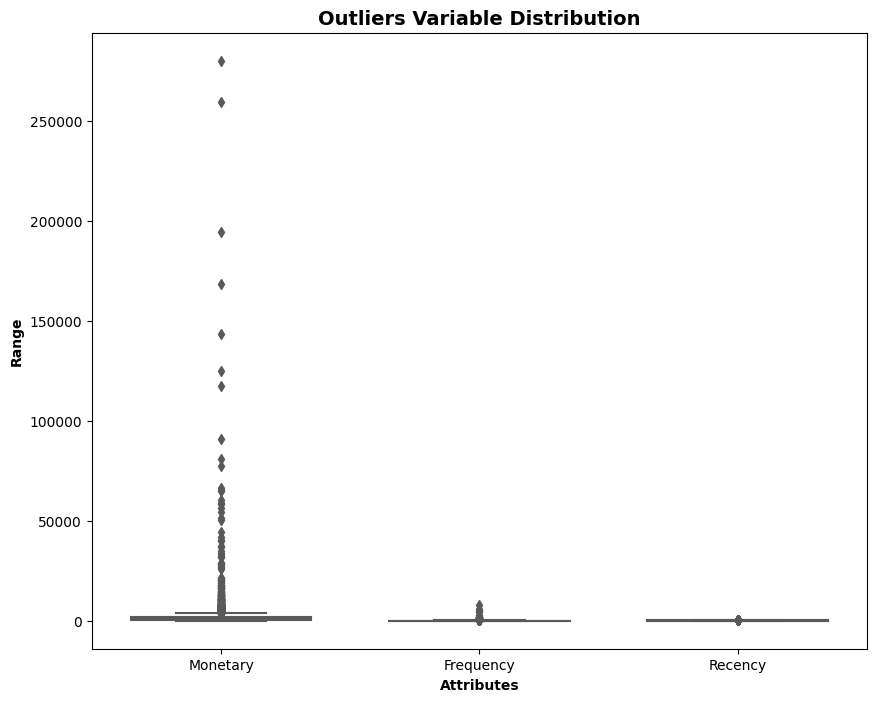

In [68]:
attributes = ['Monetary','Frequency','Recency']
plt.rcParams['figure.figsize'] = [10,8]
sns.boxplot(data = rfm_df[attributes], orient="v", palette="Set2" ,whis=1.5,saturation=1, width=0.7)
plt.title("Outliers Variable Distribution", fontsize = 14, fontweight = 'bold')
plt.ylabel("Range", fontweight = 'bold')
plt.xlabel("Attributes", fontweight = 'bold')

In [69]:
quantiles = rfm_df[attributes].quantile([0.001,0.05, 0.1, 0.95, 0.99])  # Computing specific quantiles for each column

print("Specific quantiles for each column:")
print(quantiles)


Specific quantiles for each column:
         Monetary  Frequency  Recency
0.001     13.8729       1.00      0.0
0.050    112.0200       4.00      2.0
0.100    155.2960       7.00      4.0
0.950   5789.9995     308.00    311.0
0.990  19780.4878     655.63    368.0


In [70]:
# Removing (statistical) outliers for Amount
Q1 = rfm_df.Monetary.quantile(0.05)
Q3 = rfm_df.Monetary.quantile(0.99)
IQR = Q3 - Q1
rfm_df = rfm_df[(rfm_df.Monetary >= Q1 - 1.5*IQR) & (rfm_df.Monetary <= Q3 + 1.5*IQR)]

# Removing (statistical) outliers for Recency
Q1 = rfm_df.Recency.quantile(0.05)
Q3 = rfm_df.Recency.quantile(0.99)
IQR = Q3 - Q1
rfm_df = rfm_df[(rfm_df.Recency >= Q1 - 1.5*IQR) & (rfm_df.Recency <= Q3 + 1.5*IQR)]

# Removing (statistical) outliers for Frequency
Q1 = rfm_df.Frequency.quantile(0.05)
Q3 = rfm_df.Frequency.quantile(0.99)
IQR = Q3 - Q1
rfm_df = rfm_df[(rfm_df.Frequency >= Q1 - 1.5*IQR) & (rfm_df.Frequency <= Q3 + 1.5*IQR)]

In [71]:
rfm_df.shape

(4313, 8)

In [72]:
rfm_df.describe()

,Recency,Frequency,Monetary,R,F,M,RFM_Score
count,4313.000000,4313.000000,4313.000000,4313.000000,4313.000000,4313.000000,4313.000000
mean,91.962439,81.147229,1541.647979,2.493624,2.519128,2.508695,7.521447
std,100.030816,116.342442,2932.090557,1.124247,1.120176,1.115742,2.806461
min,0.000000,1.000000,3.750000,1.000000,1.000000,1.000000,3.000000
25%,17.000000,17.000000,305.540000,1.000000,2.000000,2.000000,5.000000
50%,50.000000,40.000000,663.610000,2.000000,3.000000,3.000000,8.000000
75%,142.000000,97.000000,1628.120000,4.000000,4.000000,4.000000,10.000000
max,373.000000,1263.000000,44534.300000,4.000000,4.000000,4.000000,12.000000


In [73]:
def handle_zero(num):
    if num <= 0:
        return 1
    else:
        return num
#Apply handle_neg_n_zero function to Recency and Monetary columns
rfm_df['Recency'] = [handle_zero(x) for x in rfm_df.Recency]

In [74]:
rfm_df.describe()

,Recency,Frequency,Monetary,R,F,M,RFM_Score
count,4313.000000,4313.000000,4313.000000,4313.000000,4313.000000,4313.000000,4313.000000
mean,91.982147,81.147229,1541.647979,2.493624,2.519128,2.508695,7.521447
std,100.012789,116.342442,2932.090557,1.124247,1.120176,1.115742,2.806461
min,1.000000,1.000000,3.750000,1.000000,1.000000,1.000000,3.000000
25%,17.000000,17.000000,305.540000,1.000000,2.000000,2.000000,5.000000
50%,50.000000,40.000000,663.610000,2.000000,3.000000,3.000000,8.000000
75%,142.000000,97.000000,1628.120000,4.000000,4.000000,4.000000,10.000000
max,373.000000,1263.000000,44534.300000,4.000000,4.000000,4.000000,12.000000


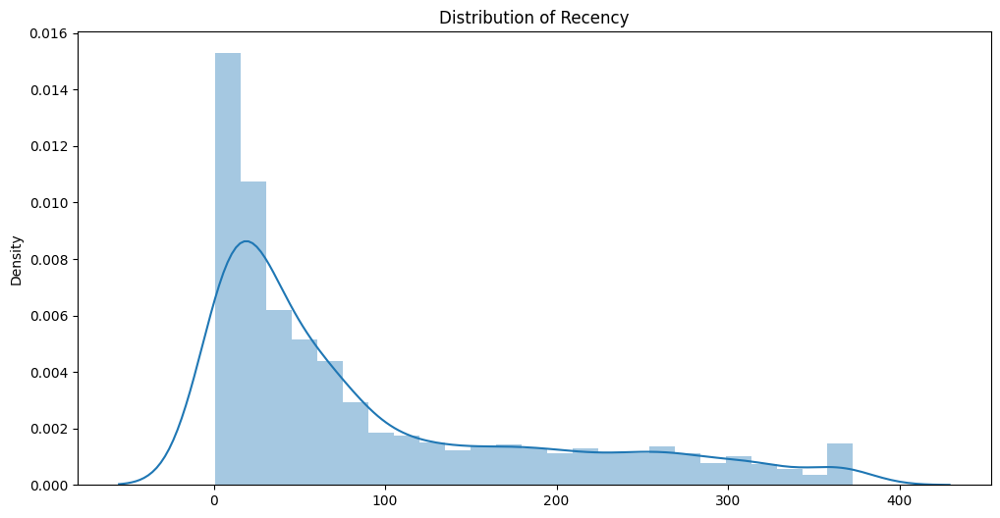

In [75]:
create_distplot(rfm_df['Recency'], 'Distribution of Recency')

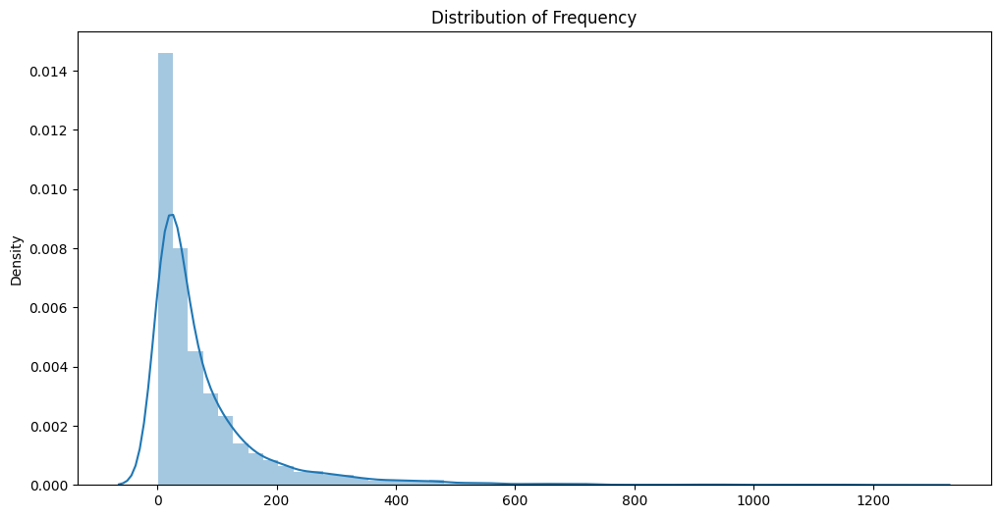

In [76]:
create_distplot(rfm_df['Frequency'], 'Distribution of Frequency')

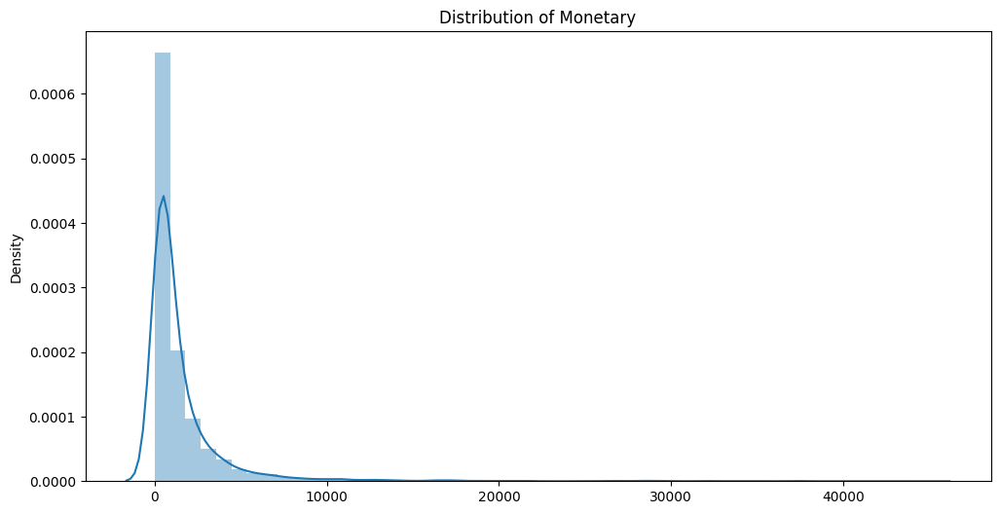

In [77]:
create_distplot(rfm_df['Monetary'], 'Distribution of Monetary')

In [78]:
#Performing Log transformation to bring data into normal or near normal distribution
columns_to_transform = ['Recency', 'Frequency', 'Monetary']

# Applying np.log and rounding to 3 decimal places to selected columns
rfm_df[['Recency_log', 'Frequency_log', 'Monetary_log']] = rfm_df[columns_to_transform].apply(np.log).round(3)

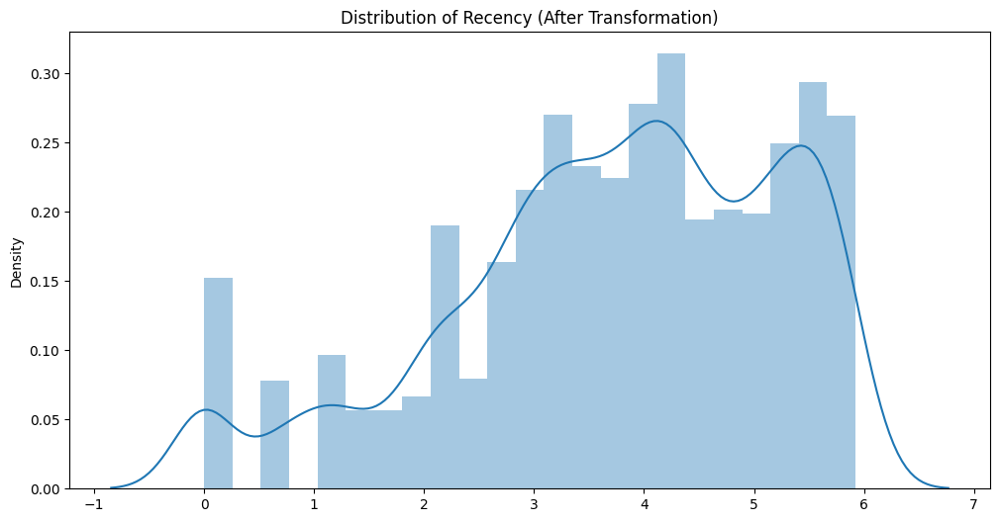

In [79]:
create_distplot(rfm_df['Recency_log'], 'Distribution of Recency (After Transformation)')

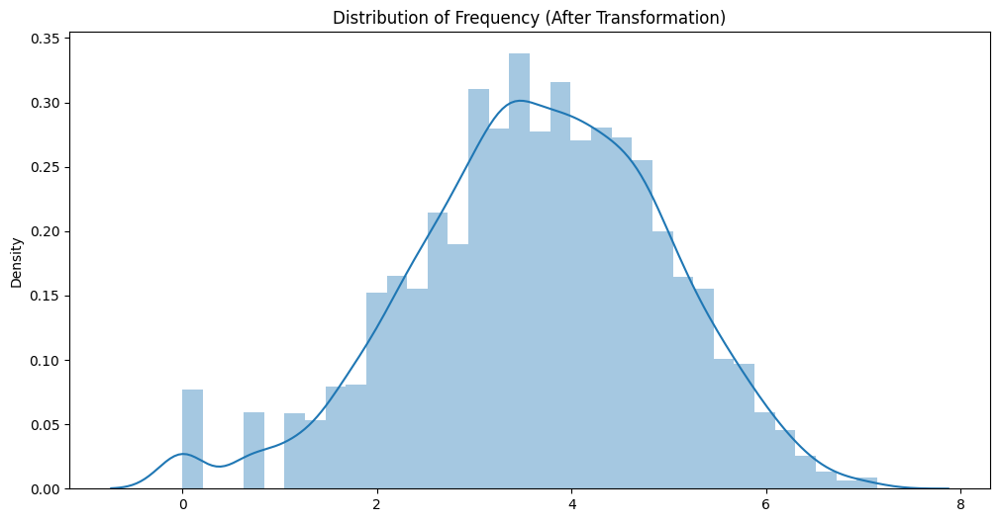

In [80]:
create_distplot(rfm_df['Frequency_log'], 'Distribution of Frequency (After Transformation)')

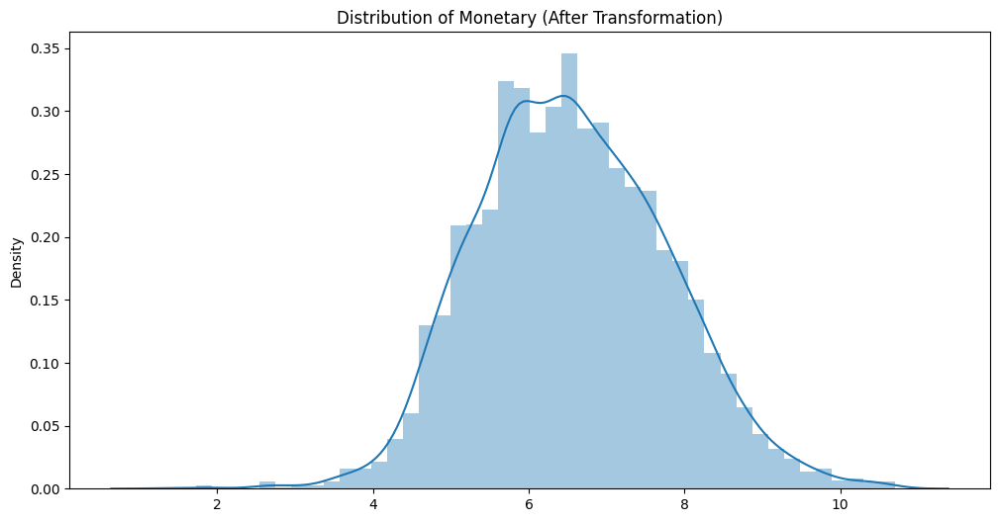

In [81]:
create_distplot(rfm_df['Monetary_log'], 'Distribution of Monetary (After Transformation)')

In [82]:
fig = px.scatter_3d(rfm_df, x='Monetary_log', y='Frequency_log', z='Recency_log',
                    color='RFM_Loyalty_Level',opacity=0.7, symbol = 'RFM_Loyalty_Level')
fig.show()

In [83]:
segment_scores = rfm_df.groupby('RFM_Loyalty_Level')['Recency_log', 'Frequency_log', 'Monetary_log'].mean().reset_index()
fig = go.Figure()
fig.add_trace(go.Bar(x=segment_scores['RFM_Loyalty_Level'], y=segment_scores['Recency_log'], 
                         name='Recency Score', marker_color='rgb(158,202,225)'))
fig.add_trace(go.Bar(x=segment_scores['RFM_Loyalty_Level'],
        y=segment_scores['Frequency_log'],name='Frequency Score', marker_color='rgb(94,158,217)'))
fig.add_trace(go.Bar(x=segment_scores['RFM_Loyalty_Level'],y=segment_scores['Monetary_log'],
                         name='Monetary Score',marker_color='rgb(32,102,148)'))
fig.update_layout(title='Comparison of RFM Segments based on Recency, Frequency, and Monetary Scores',
        xaxis_title='RFM Segments',yaxis_title='Score',barmode='group',showlegend=True)
plt.tight_layout()
fig.show()

<Figure size 1000x800 with 0 Axes>

In [84]:
segmentation_based_on_RFM=rfm_df[['Recency','Frequency','Monetary','RFM_Loyalty_Level']]
segmentation_based_on_RFM.groupby('RFM_Loyalty_Level').agg({
    'Recency': ['mean', 'min', 'max'],
    'Frequency': ['mean', 'min', 'max'],
    'Monetary': ['mean', 'min', 'max','count']
})

Recency            Frequency               Monetary  \
                         mean min  max        mean min   max         mean   
RFM_Loyalty_Level                                                           
Platinaum           19.366129   1  139  195.368548  20  1263  3737.306226   
Gold                62.869925   1  371   56.847368   1   521  1033.043069   
Silver             125.010267   1  373   24.357290   1    98   500.849612   
Bronz              217.591678  51  373   10.923277   1    39   199.080897   

                                           
                      min       max count  
RFM_Loyalty_Level                          
Platinaum          316.25  42055.96  1240  
Gold               114.34  12393.70  1330  
Silver               6.90  44534.30   974  
Bronz                3.75    660.00   769

- Before implementing Kmeans clustering, we need to decide the number of clusters.
- Using elbow method to find out minimum number of clusters.

In [85]:
def elbow_method(x):
    wcss = {}
    for k in range(1,15):
        km = KMeans(n_clusters = k, init = 'k-means++', max_iter = 100)
        km = km.fit(x)
        wcss[k] = km.inertia_
    silhouette_scores = []
    for i in range(2, 15):  # Trying cluster sizes from 2 to 10
        kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
        cluster_labels = kmeans.fit_predict(x)
        silhouette_avg = silhouette_score(x, cluster_labels)
        silhouette_scores.append(silhouette_avg)
        print(f"For n_clusters = {i}, the average silhouette_score is : {silhouette_avg}")

  # Find the optimal number of clusters with the highest silhouette score
    optimal_clusters = silhouette_scores.index(max(silhouette_scores)) + 2  # Adding 2 to account for starting from 2 clusters
    print(f"Optimal number of clusters based on silhouette score: {optimal_clusters}")
    plt.figure(figsize=(12,6))
    sns.pointplot(x = list(wcss.keys()), y = list(wcss.values()))
    plt.xlabel('Number of Clusters(k)')
    plt.ylabel('Sum of Square Distances')
    plt.title('Elbow Method to Find Optimum value of K')
    plt.show()

In [86]:
def silhouette(x, n_range):
    for n_clusters in n_range:
        # Creating a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(14, 7)

        # The silhouette plot
        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(x) + (n_clusters + 1) * 10])

        clusterer = KMeans(n_clusters=n_clusters, random_state=1)
        cluster_labels = clusterer.fit_predict(x)

        silhouette_avg = silhouette_score(x, cluster_labels)
        print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)

        sample_silhouette_values = silhouette_samples(x, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            y_lower = y_upper + 10

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(x[:, 0], x[:, 1], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')

        centers = clusterer.cluster_centers_
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o', c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')
    plt.show()

In [87]:
def check_cluster_size(x,n_range):
    for n_cluster in n_range:
        kmeans = KMeans(n_clusters=n_cluster, init='k-means++', max_iter=300, n_init=10, random_state=0)
        kmeans.fit(x)
        cluster_labels = kmeans.labels_
        temp1 = rfm_df.copy()
        temp1['Cluster'] = cluster_labels
        print('No of Clusters:', n_cluster)
        print(temp1['Cluster'].value_counts())

In [88]:
from mpl_toolkits.mplot3d import Axes3D

def silhouette_3d(x, n_range):
    for n_clusters in n_range:
        fig = plt.figure(figsize=(18, 7))
        clusterer = KMeans(n_clusters=n_clusters, random_state=1)
        cluster_labels = clusterer.fit_predict(x)
        silhouette_avg = silhouette_score(x, cluster_labels)
        print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)
        sample_silhouette_values = silhouette_samples(x, cluster_labels)
        ax1 = fig.add_subplot(121, projection='3d')
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax1.scatter(x[:, 0], x[:, 1], x[:, 2], marker='.', s=20, c=colors, alpha=0.5)

        centers = clusterer.cluster_centers_
        ax1.scatter(centers[:, 0], centers[:, 1], centers[:, 2], marker='o', c='white', alpha=1, s=400)

        for i, c in enumerate(centers):
            ax1.scatter(c[0], c[1], c[2], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

        ax1.set_title("The visualization of the clustered data in 3D")
        ax1.set_xlabel("Feature space for the 1st feature")
        ax1.set_ylabel("Feature space for the 2nd feature")
        ax1.set_zlabel("Feature space for the 3rd feature")

        ax2 = fig.add_subplot(122)
        # The silhouette plot
        ax2.set_xlim([-0.1, 1])
        ax2.set_ylim([0, len(x) + (n_clusters + 1) * 10])

        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax2.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            ax2.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            y_lower = y_upper + 10

        ax2.set_title("The silhouette plot for the various clusters.")
        ax2.set_xlabel("The silhouette coefficient values")
        ax2.set_ylabel("Cluster label")

        ax2.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax2.set_yticks([])
        ax2.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

        plt.show()


In [89]:
def result1(n_clusters, x, title, xlabel, ylabel):
    clusterer = KMeans(n_clusters=n_clusters, random_state=1)
    cluster_labels = clusterer.fit_predict(x)
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    plt.figure(figsize =(4,4))
    data = pd.DataFrame({'Feature1': x[:, 0], 'Feature2': x[:, 1], 'Cluster': cluster_labels})  # Convert numpy array to DataFrame if needed

    sns.scatterplot(data=data, x='Feature1', y='Feature2', marker='.', s=30, lw=0, alpha=0.7, hue='Cluster', palette='viridis')

    centers = clusterer.cluster_centers_
    sns.scatterplot(x=centers[:, 0], y=centers[:, 1], marker='o', color="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        plt.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

In [90]:
def result1_3d(n_clusters, x, title, xlabel, ylabel, zlabel):
    clusterer = KMeans(n_clusters=n_clusters, random_state=1)
    cluster_labels = clusterer.fit_predict(x)
    x_df = pd.DataFrame(x, columns=[xlabel, ylabel, zlabel])
    x_df['Cluster'] = cluster_labels
    x_df['Cluster'] = x_df['Cluster'].astype(str)  # Convert cluster labels to string for annotations

    fig = px.scatter_3d(x_df, x=xlabel, y=ylabel, z=zlabel, color='Cluster', symbol='Cluster',
                        title=title, opacity=0.5)
    fig.show()

## **Analysis on Recency and Monetary:**
By analyzing Recency and Monetary aspects together, we can identify various customer segments:

### **High-Value Recent Customers:**
- These are customers who have both recently interacted with the business and have spent a considerable amount. They represent an ideal segment for immediate engagement and retention strategies.

### **Loyal Yet Lower Spending Customers:**
- Some customers might show consistent engagement (good recency) but have lower monetary value. They might benefit from targeted promotions or incentives to increase their spending.

### **High Spenders with Decreasing Engagement:**
- Customers who used to spend significantly but haven't engaged recently. Re-engaging this segment is crucial to prevent churn.

For n_clusters = 2, the average silhouette_score is : 0.4205868339108496
For n_clusters = 3, the average silhouette_score is : 0.3478059172322077
For n_clusters = 4, the average silhouette_score is : 0.36561945145577185
For n_clusters = 5, the average silhouette_score is : 0.35064819028619976
For n_clusters = 6, the average silhouette_score is : 0.35202401934804833
For n_clusters = 7, the average silhouette_score is : 0.34771920182319505
For n_clusters = 8, the average silhouette_score is : 0.34347584011229476
For n_clusters = 9, the average silhouette_score is : 0.34707154115270317
For n_clusters = 10, the average silhouette_score is : 0.3502504256906234
For n_clusters = 11, the average silhouette_score is : 0.342794482757186
For n_clusters = 12, the average silhouette_score is : 0.34298535788040446
For n_clusters = 13, the average silhouette_score is : 0.33813921162859817
For n_clusters = 14, the average silhouette_score is : 0.3429607111732006
Optimal number of clusters based on sil

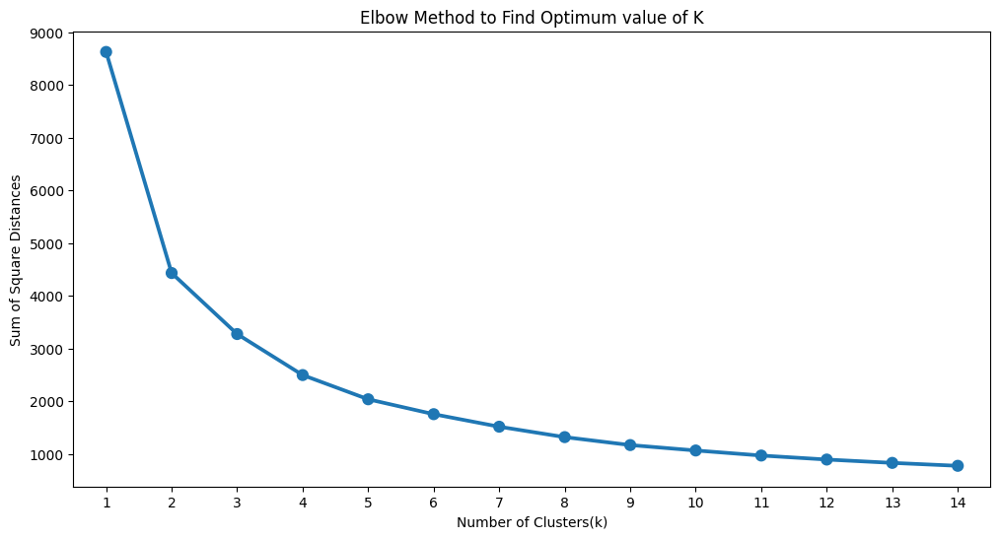

In [91]:
rm_list = ['Recency_log','Monetary_log']
x = rfm_df[rm_list].values
scaler = StandardScaler()
x = scaler.fit_transform(x)
elbow_method(x)

For n_clusters = 2 The average silhouette_score is : 0.4205868339108496
For n_clusters = 3 The average silhouette_score is : 0.34787465545268187
For n_clusters = 4 The average silhouette_score is : 0.3653726811523503


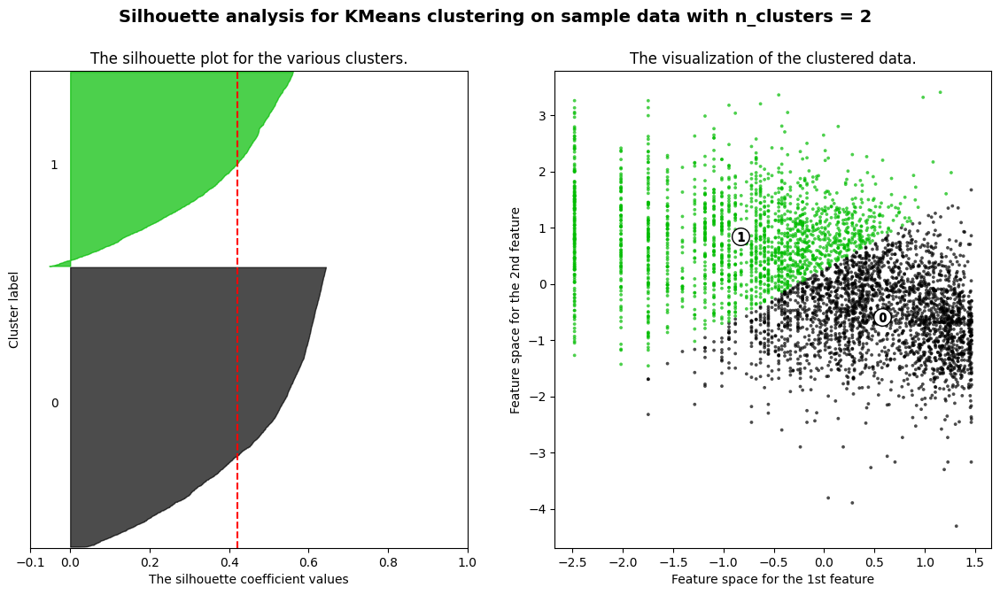

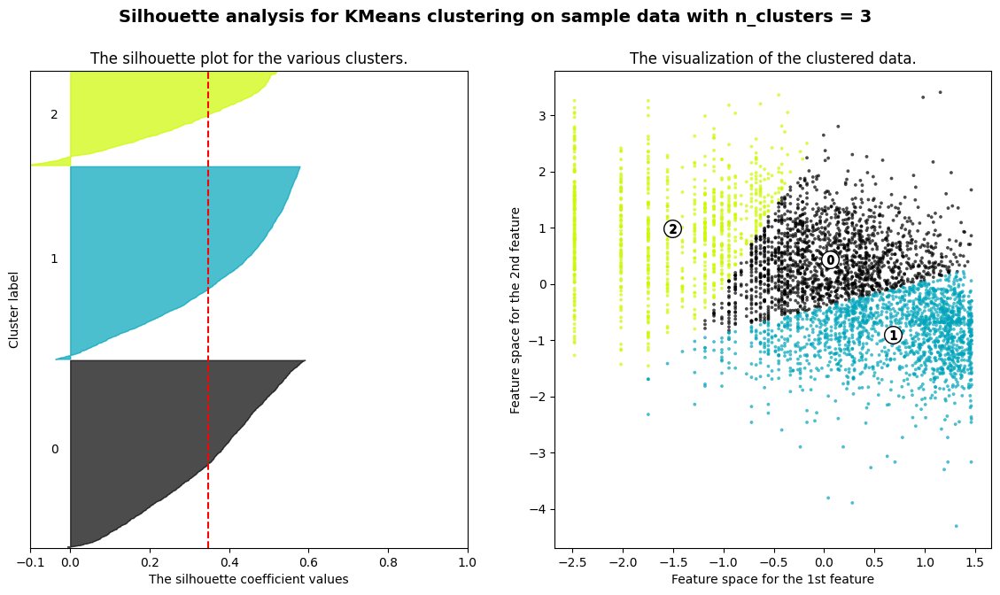

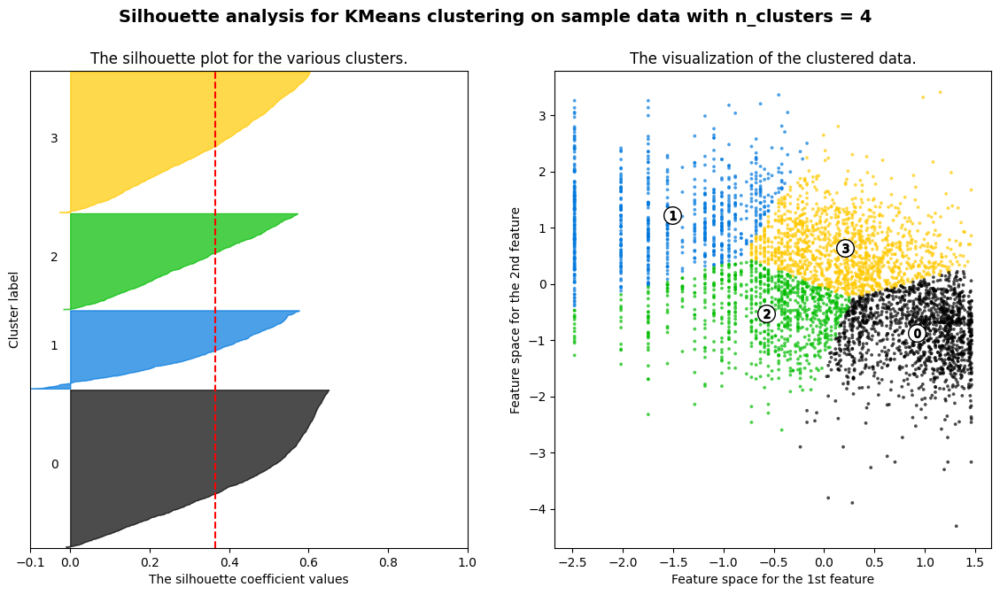

In [92]:
n_range = [2,3,4]
silhouette(x,n_range)

In [93]:
check_cluster_size(x,n_range)

No of Clusters: 2
1    2545
0    1768
Name: Cluster, dtype: int64
No of Clusters: 3
1    1752
0    1708
2     853
Name: Cluster, dtype: int64
No of Clusters: 4
3    1442
2    1285
0     872
1     714
Name: Cluster, dtype: int64


# **Analysis on Frequency and Monetary**

### By analyzing Frequency and Monetary aspects together, we can identify various customer segments:

### **High Frequency, High Monetary:**
- These are your ideal customers - loyal and high-spending. Focus on retention and loyalty programs to keep them happy.
### **High Frequency, Low Monetary:**
- These customers are engaged but spend less. Analyze their buying behavior and offer discounts or value-added bundles to entice them to spend more.
### **Low Frequency, High Monetary:**
- Although they purchase less often, their high spending makes them crucial. Targeted campaigns can encourage them to buy more frequently.
### **Low Frequency, Low Monetary:**
- These customers might be on the verge of churn. Analyze their purchase history and offer targeted re-engagement campaigns or win-back strategies.

For n_clusters = 2, the average silhouette_score is : 0.48121963300077203
For n_clusters = 3, the average silhouette_score is : 0.4118532841966996
For n_clusters = 4, the average silhouette_score is : 0.37152556302550566
For n_clusters = 5, the average silhouette_score is : 0.34081890047890145
For n_clusters = 6, the average silhouette_score is : 0.3568166207181227
For n_clusters = 7, the average silhouette_score is : 0.34290062789013087
For n_clusters = 8, the average silhouette_score is : 0.35161461194603216
For n_clusters = 9, the average silhouette_score is : 0.36269900974894975
For n_clusters = 10, the average silhouette_score is : 0.34817691672317974
For n_clusters = 11, the average silhouette_score is : 0.36459958227515865
For n_clusters = 12, the average silhouette_score is : 0.35369363574492535
For n_clusters = 13, the average silhouette_score is : 0.361735404423102
For n_clusters = 14, the average silhouette_score is : 0.3497790245023191
Optimal number of clusters based on si

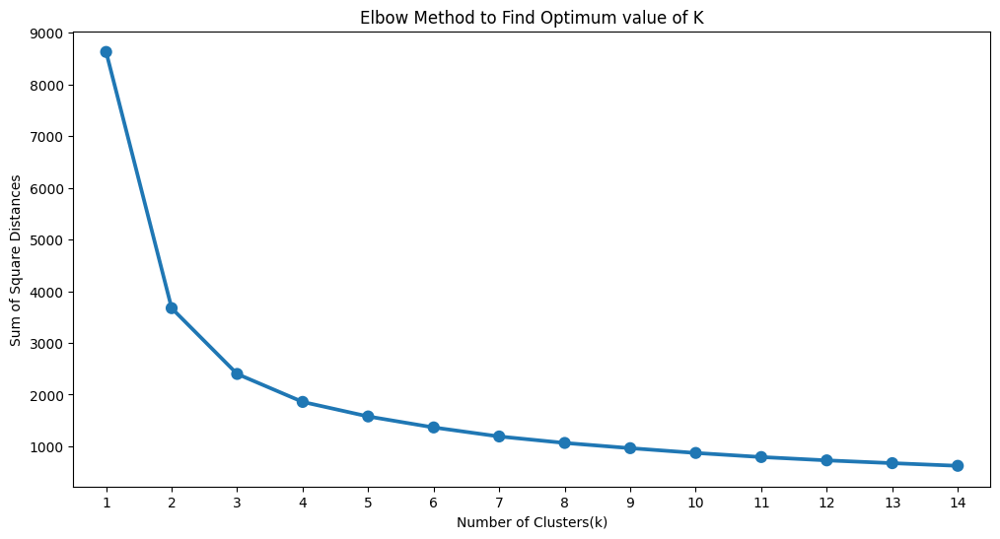

In [94]:
rm_list = ['Frequency_log','Monetary_log']
x1 = rfm_df[rm_list].values
scaler = StandardScaler()
x1 = scaler.fit_transform(x1)
elbow_method(x1)

For n_clusters = 2 The average silhouette_score is : 0.48121963300077203
For n_clusters = 3 The average silhouette_score is : 0.4129792655957911
For n_clusters = 4 The average silhouette_score is : 0.37152461350237137


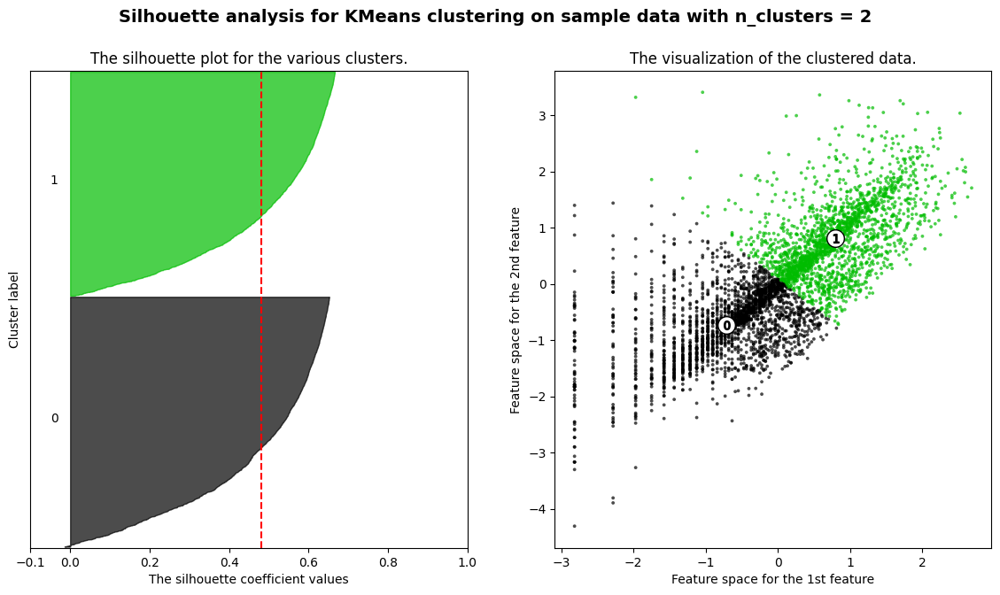

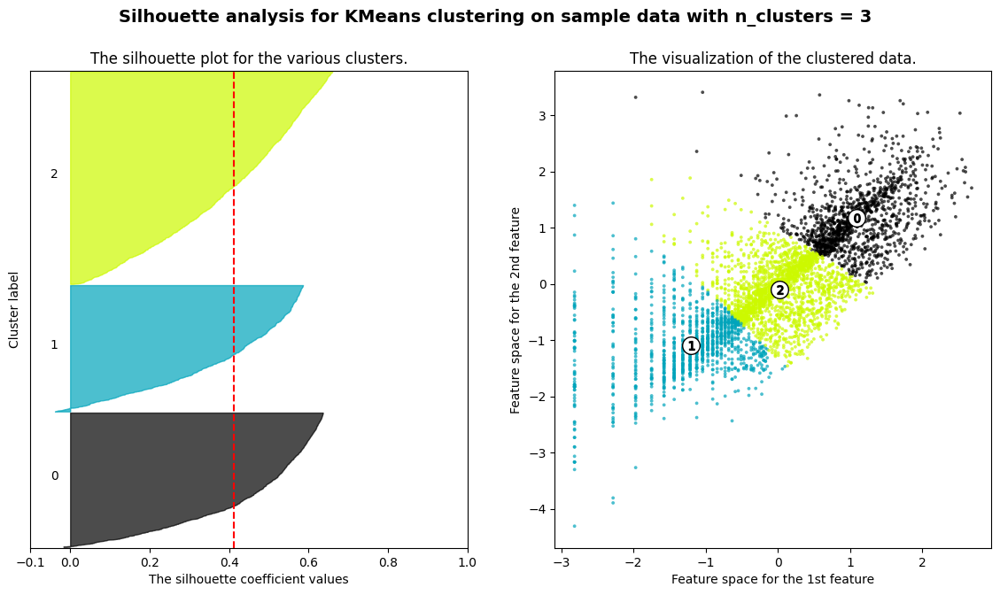

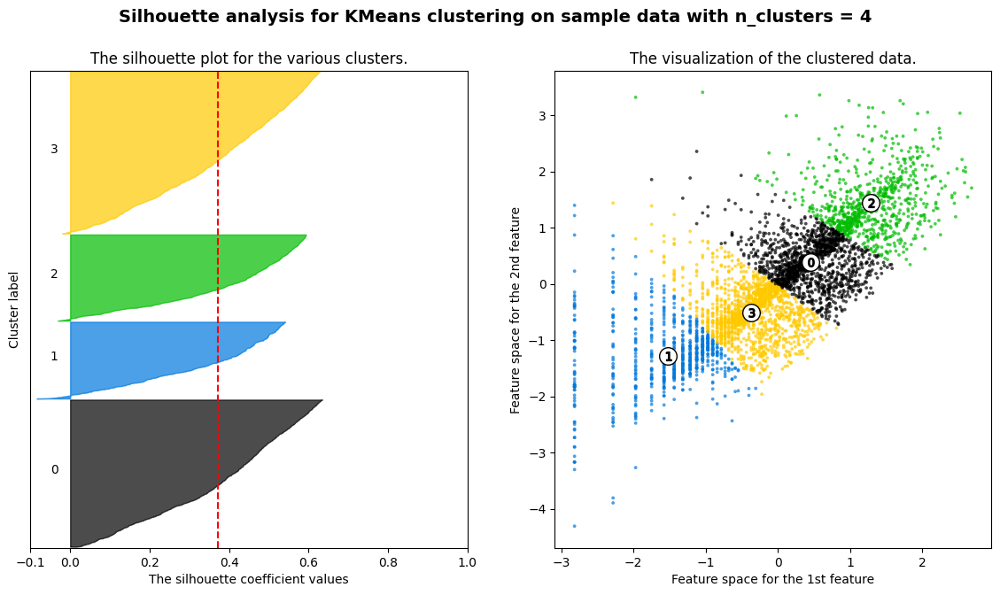

In [95]:
n_range = [2,3,4]
silhouette(x1,n_range)

In [96]:
check_cluster_size(x1,n_range)

No of Clusters: 2
1    2275
0    2038
Name: Cluster, dtype: int64
No of Clusters: 3
2    1904
0    1214
1    1195
Name: Cluster, dtype: int64
No of Clusters: 4
3    1480
1    1343
2     788
0     702
Name: Cluster, dtype: int64


# Analysis using Recency, Frequency and Monetary
## **High Recency, High Frequency, High Monetary:**
-These are the most engaged and valuable customers, needing personalized attention and rewards to maintain loyalty.
## **High Recency, Low Frequency, High Monetary:**
-They may not buy frequently but spend significantly when they do. Tailored promotions might increase their frequency of purchase.
## **Low Recency, High Frequency, Low Monetary**
-These customers purchase often but spend less. Strategies focusing on increasing their average spending per transaction could be beneficial.
## **Low Recency, Low Frequency, Low Monetary**:
-These customers are less engaged and contribute less to revenue. Re-engagement strategies or incentives might be necessary to regain their interest.

For n_clusters = 2, the average silhouette_score is : 0.39546570339425235
For n_clusters = 3, the average silhouette_score is : 0.30378201426760704
For n_clusters = 4, the average silhouette_score is : 0.301290766619791
For n_clusters = 5, the average silhouette_score is : 0.28021194857685955
For n_clusters = 6, the average silhouette_score is : 0.279919300314484
For n_clusters = 7, the average silhouette_score is : 0.26960380200971285
For n_clusters = 8, the average silhouette_score is : 0.2698187225334046
For n_clusters = 9, the average silhouette_score is : 0.2581428446573389
For n_clusters = 10, the average silhouette_score is : 0.26195465348772784
For n_clusters = 11, the average silhouette_score is : 0.26950049871151116
For n_clusters = 12, the average silhouette_score is : 0.2616190458078279
For n_clusters = 13, the average silhouette_score is : 0.26394348091720554
For n_clusters = 14, the average silhouette_score is : 0.25701266005585316
Optimal number of clusters based on silh

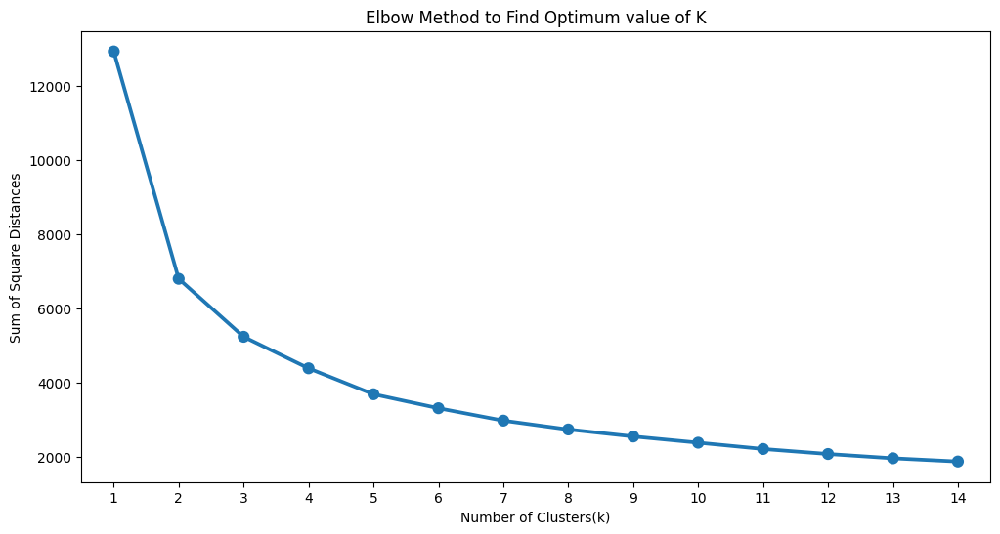

In [97]:
rm_list = ['Recency_log','Monetary_log','Frequency_log']
x2 = rfm_df[rm_list].values
scaler = StandardScaler()
x2 = scaler.fit_transform(x2)
elbow_method(x2)

For n_clusters = 2 The average silhouette_score is : 0.39546570339425235


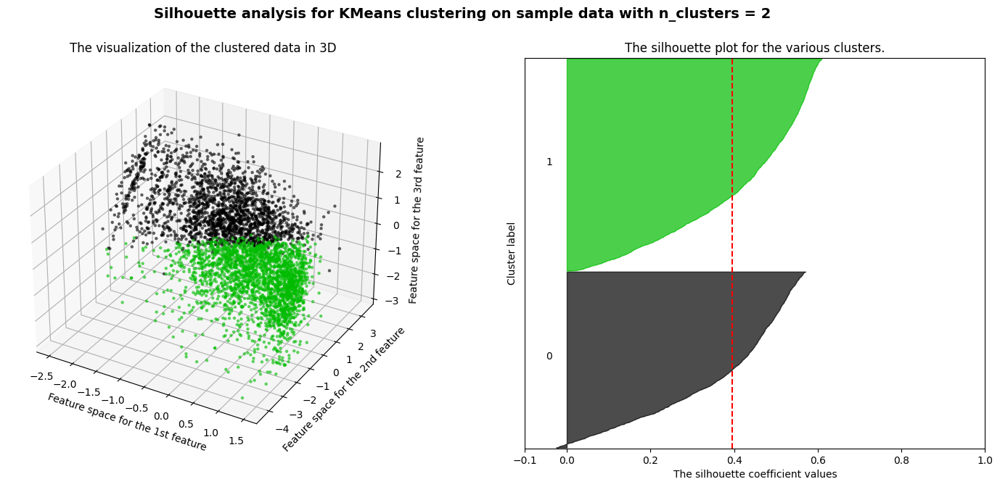

For n_clusters = 3 The average silhouette_score is : 0.30378201426760704


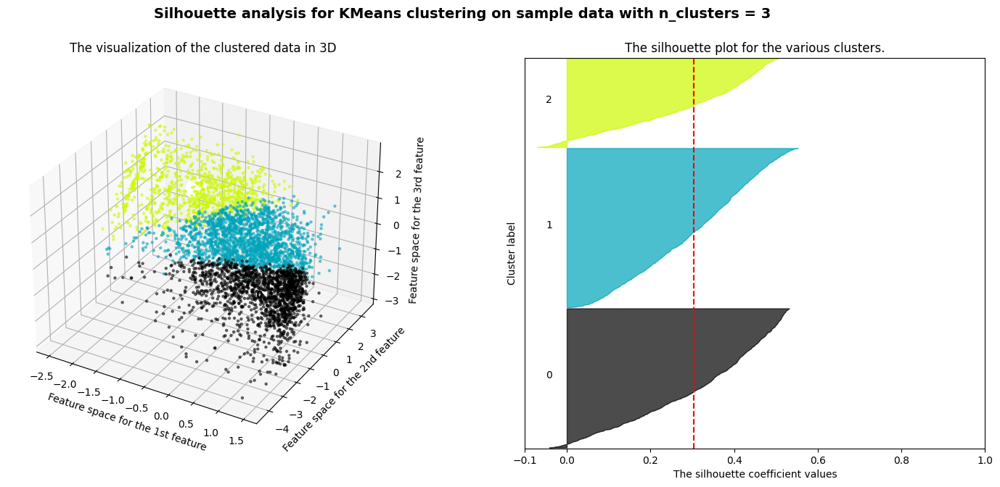

For n_clusters = 4 The average silhouette_score is : 0.3025290026515857


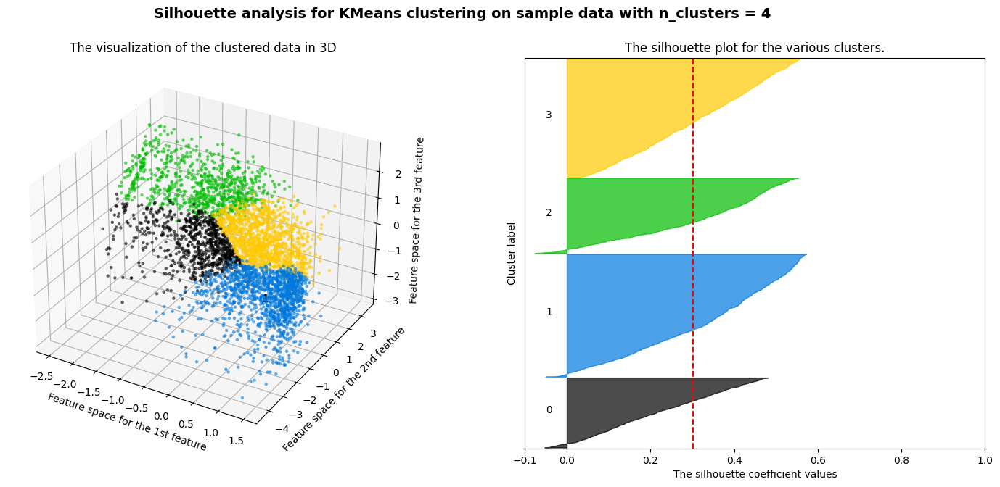

In [98]:
n_range = [2,3,4]
silhouette_3d(x2,n_range)

In [99]:
check_cluster_size(x2,n_range)

No of Clusters: 2
1    2357
0    1956
Name: Cluster, dtype: int64
No of Clusters: 3
0    1776
1    1551
2     986
Name: Cluster, dtype: int64
No of Clusters: 4
2    1365
0    1299
1     846
3     803
Name: Cluster, dtype: int64


<font color="#A020F0"><h2>Geographic Insights and Customer Behavior</h2></font>

**Customer Distribution:** 
- The customer base predominantly consists of UK-based customers, comprising almost 90% of the total customer count.
- Germany and France contribute a mere 2% each, while the remaining countries have customer counts below 1%.
- Focusing on localizing strategies for the UK market might be crucial due to its dominance.

**Sales Figures and Geography:** 
- UK stands out in terms of sales figures, accounting for approximately 82% of the total sales. 
- Netherlands, EIRE, Germany, and France follow, each contributing around 2-3% of the total sales. 
- This highlights the significance of the UK market in driving revenue, followed by a few other European countries.

**Order Distribution:** 
- Most orders originate from the UK, constituting about 90% of the total order count. 
- Germany and France follow with smaller but notable percentages. 
- Considering the geographical distribution of orders can assist in prioritizing markets for marketing efforts or expansion strategies.

**Order Trends by Month:** 
- November emerges as the peak month for orders, comprising around 15% of the total orders, followed by December and October. 
- Interestingly, there is a decrease in order counts in December, indicating a potential trend related to seasonal variations or festivities.

**Ordering Days:** 
- Thursday and Wednesday witness the most order placements, with no record of orders on Saturdays. Fridays seem to have the least order count. 
- Understanding these day-wise trends can aid in scheduling promotions or marketing activities for maximum impact.

**Ordering Times:** 
- Most orders are placed around midday, followed by the morning hours, whereas evening and late-night hours show relatively lower order counts. 
- Tailoring marketing efforts or promotions during these peak hours might yield better engagement and conversions.

**Ordering Date in a Month:** 
- The 6th of every month records the highest number of orders, gradually decreasing toward the end of the month. 
- Days 5 to 8 see a peak in order count, followed by a gradual decline, indicating potential trends in customer behavior related to monthly timelines.

**Product Insights:** 
- The 'Regency Cakestand 3 Tier' is the most returned item, highlighting potential issues with this product. Conversely, 'White Hanging Heart T-Light Holder' is the best-selling item, indicating high demand and customer preference for this product. 
- Understanding these product-specific trends can help in inventory management and product development strategies.

<font color="#A020F0"><h2>Recency and Monetary Analysis Insights</h2></font>

### Cluster 0: High Recency, Low Monetary

- **Insights:**
  - Customers in this cluster haven't made recent purchases, and historically, their spending has been low.
  - This segment might include customers who made minimal purchases in the past and haven't been active since.
  - They might be less engaged or less interested in purchasing, posing a challenge for reactivation.

- **Actions:**
  - Reactivation Strategies: Implement enticing offers or personalized campaigns to encourage future purchases.
  - Customer Engagement Initiatives: Create targeted marketing approaches to re-engage this segment.

### Cluster 1: Low Recency, High Monetary

- **Insights:**
  - Customers in this cluster have recently made purchases and have spent a significant amount.
  - They are both active and valuable to the business.
  - These customers are considered the most desirable as they contribute significantly to revenue, and their recent activity indicates continued engagement and loyalty.

- **Actions:**
  - Retention Programs: Implement loyalty rewards or exclusive offers to maintain their engagement.
  - Customer Appreciation Campaigns: Show appreciation for their continued support with personalized incentives.

### Cluster 2: Low Recency, Low Monetary

- **Insights:**
  - This cluster includes customers who have made purchases in the past but haven't spent a considerable amount recently.
  - While they have been active, their recent transactions are minimal.
  - These customers might have lower overall value compared to Cluster 1 but could still have the potential for re-engagement or targeted marketing strategies to increase their spending.

- **Actions:**
  - Re-engagement Initiatives: Implement targeted marketing or offers to increase their recent transaction frequency and spending.
  - Personalized Recommendations: Provide tailored product suggestions to reignite their interest.

### Cluster 3: High Recency, High Monetary

- **Insights:**
  - These customers have high recency, meaning they haven't made recent purchases, but historically they have spent a significant amount.
  - While they might not be actively engaging currently, their past high-value transactions suggest they were valuable customers.
  - It could be worthwhile to re-engage this segment through targeted campaigns or incentives to regain their interest.

- **Actions:**
  - Re-engagement Campaigns: Launch targeted campaigns or incentives to bring these high-value customers back.
  - Personalized Offers: Provide tailored offers based on their past high-value transactions to reignite their interest.


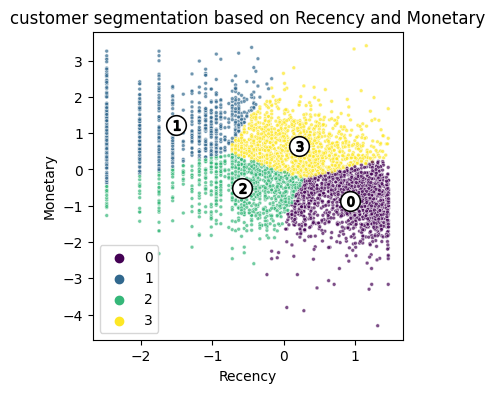

In [100]:
result1(4,x,'customer segmentation based on Recency and Monetary','Recency','Monetary')

<h3 style="color: #800080">Summary:</h3>

- **Retention Strategies:** Cluster 1 and possibly Cluster 3 represent valuable customers who need retention strategies to keep them engaged and ensure their continued loyalty.
- **Reactivation Campaigns:** Cluster 2 might benefit from reactivation campaigns to encourage repeat purchases and increase their spending.
- **Engagement Tactics:** Cluster 0 might require tailored engagement tactics or incentives to win back their interest and encourage higher-value transactions.

<font color="#A020F0"><h2>Frequency and Monetary Analysis Insights</h2></font>
### Cluster 0: High Frequency, High Monetary

- **Insights:**
  - These customers make purchases frequently, and their total spending (monetary value) is also high.
  - They represent valuable and active customers who contribute significantly to the revenue.

- **Actions:**
  - Reward Loyalty: Implement loyalty programs or exclusive offers to retain these valuable customers.
  - Personalized Upselling: Offer premium products or services to increase their average transaction value.
  - Engagement Campaigns: Maintain regular communication to reinforce their loyalty and keep them engaged with the brand.

### Cluster 1: Low Frequency, Low Monetary

- **Insights:**
  - This cluster comprises customers who make infrequent purchases with relatively low spending.
  - They might be occasional buyers or those who spend less per transaction.

- **Actions:**
  - Reactivation Campaigns: Design targeted campaigns to re-engage these customers, offering incentives or discounts to encourage repeat purchases.
  - Understanding Needs: Conduct surveys or gather feedback to understand barriers preventing them from purchasing more frequently or spending more.
  - Promotions and Bundles: Offer bundled deals or promotions to entice them into larger purchases.

### Cluster 2: Mid Frequency, Mid Monetary

- **Insights:**
  - Customers in this cluster demonstrate moderate purchase frequencies and spend moderate amounts.
  - They fall between the high-value and low-value segments, representing a middle ground in terms of purchasing behavior and spending.

- **Actions:**
  - Personalized Recommendations: Provide personalized product recommendations based on their purchase history to increase transaction values.
  - Upselling Opportunities: Identify opportunities to upsell or cross-sell additional products or services.
  - Engagement and Loyalty Building: Implement strategies to increase their frequency of purchase gradually, such as loyalty rewards for reaching certain milestones.


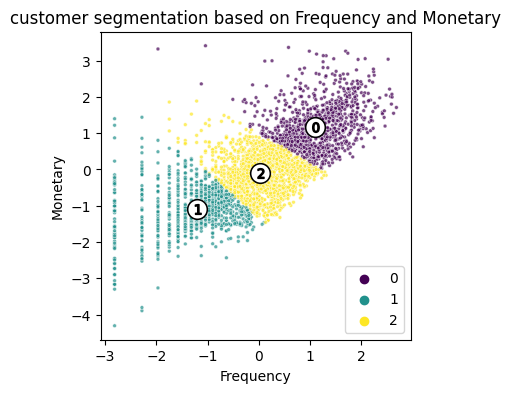

In [101]:
result1(3,x1,'customer segmentation based on Frequency and Monetary','Frequency','Monetary')

<h3 style="color: #800080">Summary:</h3>

- **Maximizing Customer Value:** For Cluster 0, strategies should focus on increasing the transaction values, thereby maximizing the value from frequent interactions.
- **Maintaining Engagement:** Cluster 1 requires strategies to maintain engagement despite longer intervals between purchases to ensure continued high-value transactions.
- **Encouraging More Transactions:** Cluster 2 might benefit from initiatives that encourage both more frequent purchases and increased spending per transaction.
- **Loyalty and Retention:** Cluster 3 represents the most valuable segment, requiring strategies to foster loyalty and ensure continued high-frequency, high-value transactions.

<font color="#A020F0"><h2>Recency, Frequency and Monetary Analysis Insights</h2></font>

### Cluster 0: High Recency, Low Monetary, Low Frequency

- **Insights:**
  - These customers have high recency, meaning they haven't made purchases recently. Additionally, they have low monetary value (low spending) and low frequency (few purchases).
  - They might be occasional or inactive customers who haven't engaged much with the business recently.
  - They might be at risk of churning or have become disengaged.

- **Actions:**
  - Re-engagement Campaigns: Launch targeted campaigns via emails, offering discounts or incentives to encourage their return.
  - Personalized Recommendations: Provide personalized product suggestions based on their previous purchases to reignite interest.
  - Feedback Collection: Reach out to understand why they haven't been active and use the feedback to improve services or offerings.

### Cluster 1: Moderate Recency, Moderate Monetary, Moderate Frequency

- **Insights:**
  - Customers in this cluster show moderate values across all three parameters: recency, monetary value, and frequency.
  - They might be the average, steady customers who make purchases at a moderate rate and spend moderately.

- **Actions:**
  - Customer Loyalty Programs: Incentivize them to increase their spending by introducing loyalty rewards or tier-based programs.
  - Product Bundling or Offers: Create bundled offers or discounts for multiple purchases to encourage higher spending or frequency.
  - Customer Satisfaction Surveys: Gauge their satisfaction levels and understand areas for improvement to potentially increase their engagement.

### Cluster 2: Low Recency, High Monetary, High Frequency

- **Insights:**
  - This cluster represents customers with low recency (they've made recent purchases), high monetary value (they spend more), and high frequency (they make purchases frequently).
  - These could be loyal, high-value customers who are actively engaged with the business and make frequent purchases.

- **Actions:**
  - Exclusive VIP Offers: Reward their loyalty with exclusive discounts, early access to products, or VIP services.
  - Referral Programs: Encourage them to refer friends with incentives, leveraging their loyalty to expand the customer base.
  - Feedback Collection: Engage them for feedback to maintain their satisfaction levels and adapt services accordingly.


In [102]:
result1_3d(3, x2, '3d Plot', 'Recency', 'Monetary', 'Frequency')

<h3 style="color: #800080"> Summary: </h3>

- **Reactivation Strategies:** Cluster 0 might require reactivation strategies to re-engage and encourage more frequent and higher-value transactions.
- **Maintaining Engagement:** Cluster 1 represents a stable segment that needs consistent engagement strategies to ensure they remain active and potentially increase their spending or frequency.
- **Loyalty and Satisfaction:** Cluster 2 comprises high-value, highly engaged customers requiring personalized experiences, loyalty rewards, and retention strategies to maintain their satisfaction and loyalty.

### Future Possibilities of the Project:

- **Refining Analysis Goals and Customer Clustering:** Clearly defining specific goals for the analysis allows for a more targeted approach. Further advancements in customer clustering techniques, potentially leveraging machine learning algorithms, can yield more accurate and actionable insights into customer behavior.

- **Minimizing Calculation Errors:** Implementing rigorous error-checking mechanisms and validation processes can contribute to minimizing errors in calculations. Regularly reviewing and refining the computational methodologies ensures the reliability of analytical outcomes.

- **Real-time Dashboard Development:** Creating a real-time dashboard offers stakeholders immediate access to up-to-date information. This feature provides a dynamic and responsive interface, facilitating timely decision-making based on the most current data trends and insights.

- **Customer Purchase Behavior Recommendations:** Developing recommendation systems based on customer purchase behaviors enhances personalization and engagement. Leveraging machine learning algorithms to analyze historical data can generate tailored recommendations, fostering a more satisfying and relevant shopping experience for customers.

**Embracing these future possibilities will not only fortify the project's analytical capabilities but also contribute to the development of a sophisticated and responsive system that adapts to evolving customer needs and market dynamics.**

<h3 style="color: #800080">Conclusion:</h3>

**K-means clustering and RFM analysis offers a transformative lens for retail, enabling a profound understanding of diverse customer segments. Tailoring marketing and product strategies to these distinct clusters empowers businesses to forge deeper connections with customers. By personalizing engagement and consistently meeting the unique needs of each segment, retail stores can elevate satisfaction levels and foster enduring loyalty. Moreover, leveraging these insights propels agile adaptations, ensuring strategies remain finely attuned to evolving customer behaviors, steering the retail landscape towards sustained growth and customer-centric innovation.**

<h3 style="color: #800080">References:</h3>

- Plotly Express Documentation: (https://plotly.com/python/plotly-express/)
- Sklearn Documentation: (https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)
- Numpy Documentation: https://numpy.org/doc/stable/reference/generated/numpy.log.html
- Hastie, T., Tibshirani, R., & Friedman, J. (2009). The Elements of Statistical Learning. Springer.